# RT60 Approximation
How long does it take for the sound's amplitude to decrease by 60dB?

## 1. Generate impulse signal

In [27]:
%matplotlib inline

import math
import numpy as np
import matplotlib.pyplot as plt
import IPython.display as ipd
import librosa, librosa.display

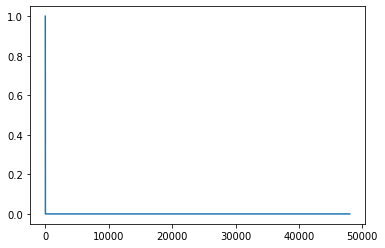

In [20]:
sr = 48000
x = np.zeros((sr))
x[0] = 1
plt.plot(x)

In [16]:
ipd.Audio(x, rate=sr)

In [22]:
librosa.output.write_wav("out/impulse.wav", x, sr=sr)

## (1b. Obtain impulse responses)

In this case we're processing using our plugin in a DAW. See *impulse_responses Project/impulse_responses.als* for the actual project file.

Params used:
```
ALGORITHM = Stautner-Puckette
TIME = 0.4 (short), 0.7 (long)
MODULATION = 3.08
DRY/WET = 1.0
PREDELAY = 0.0
DIFFUSION = 0.38
LPF = 10000
```

## 2. Read in measurements and calculate RT60

In [23]:
y1, sr = librosa.load("out/impulseResponse_t40.wav", sr=sr)

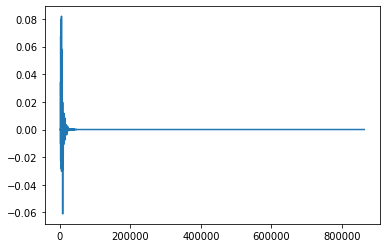

In [26]:
plt.plot(y1)

In [25]:
ipd.Audio(y1, rate=sr)

### Normalize

In [39]:
y1 = y1 / np.max(np.abs(y1))

### Convert to dB

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:1: RuntimeWarning: divide by zero encountered in log10
  """Entry point for launching an IPython kernel.


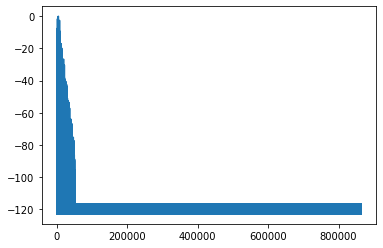

In [40]:
y1_dB = 20.0 * np.log10(np.abs(y1))
plt.plot(y1_dB)

### Show time in seconds instead of samples

In [121]:
N = len(y1)
t = np.arange(0, N) / sr
t = t.T

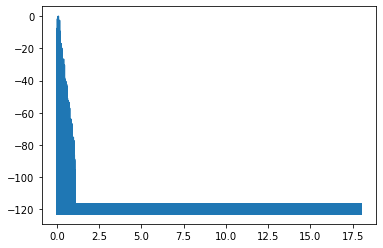

In [122]:
plt.plot(t, y1_dB)

In [116]:
# %matplotlib widget

### First zero crossing

In [136]:
zero_crossing = np.where(y1_dB >= 0)[0][0]
zero_crossing = zero_crossing / sr
zero_crossing

0.09233333333333334

### Searching for when it first goes below -60

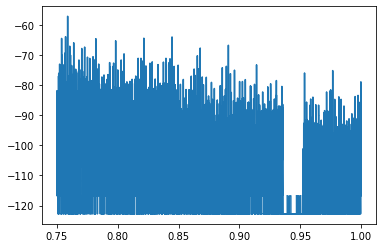

In [208]:
search_start = math.floor(0.75 * sr)
search_end = math.floor(1.0 * sr)
plt.plot(t[search_start:search_end], y1_dB[search_start:search_end])

so it's around 0.8s

### Calculate RT60

In [209]:
rt60_candidates = np.where(y1_dB[search_start:search_end] >= -60)[0] # Get candidates
rt60 = rt60_candidates[-1] # Find *last* candidate in range
rt60 = rt60 + search_start # Add search_start offset
rt60 = rt60 / sr # Convert from samples to seconds
rt60 = rt60 - zero_crossing # Add zero_crossing offset
rt60

0.6666041666666667

^ That's it!

## 3. Do the same thing with the long IR
And also encapsulate some of these operations into functions

### Load and convert IR data

In [225]:
def load_and_convert_impulse_response_data(filepath, sr):
    # Load file
    y, sr = librosa.load(filepath, sr=sr)
    
    # Normalize
    y = y / np.max(np.abs(y))
    
    # Convert to dB
    y_dB = 20.0 * np.log10(np.abs(y))
    
    # Time in seconds
    N = len(y)
    t = np.arange(0, N) / sr
    t = t.T
    
    # Plot dB along time
    plt.plot(t, y_dB)
    
    return (y, y_dB, t)

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:9: RuntimeWarning: divide by zero encountered in log10
  if __name__ == '__main__':


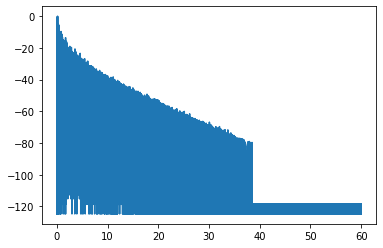

In [226]:
y2, y2_dB, t2 = load_and_convert_impulse_response_data("out/impulseResponse_t70.wav", sr=sr)

In [227]:
ipd.Audio(y2, rate=sr)

### Calculate first zero crossing

In [228]:
def calculate_zero_crossing(y_dB, sr):
    zero_crossing = np.where(y_dB >= 0)[0][0]
    zero_crossing = zero_crossing / sr
    return zero_crossing

In [229]:
z2 = calculate_zero_crossing(y2_dB, sr)
z2

0.16177083333333334

### Search for -60dB range
i.e when it first goes below -60dB. This part could probably be automated, but we're doing it by hand for now

Eyeballing it from the above plot, it seems to be around 30s

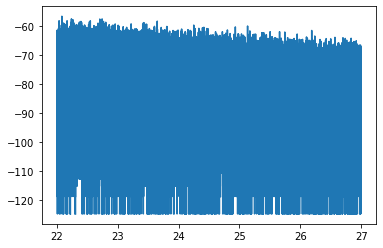

In [230]:
search_start = math.floor(22.0 * sr)
search_end = math.floor(27.0 * sr)
plt.plot(t2[search_start:search_end], y2_dB[search_start:search_end])

In [231]:
def calculate_rt60_from_search_range(y_dB, search_start, search_end, zero_crossing):
    rt60_candidates = np.where(y_dB[search_start:search_end] >= -60)[0] # Get candidates
    rt60 = rt60_candidates[-1] # Find *last* candidate in range
    rt60 = rt60 + search_start # Add search_start offset
    rt60 = rt60 / sr # Convert from samples to seconds
    rt60 = rt60 - zero_crossing # Add zero_crossing offset
    return rt60

In [232]:
rt60_2 = calculate_rt60_from_search_range(y2_dB, search_start, search_end, z2)
rt60_2

24.088062500000003

^ There we go!

### So, to recap:

In [234]:
print("RT60 for delay time=0.4 is {}\nRT60 for delay time=0.7 is {}".format(rt60, rt60_2))

RT60 for delay time=0.4 is 0.6666041666666667
RT60 for delay time=0.7 is 24.088062500000003


Great! Now we'll adjust our plugin `TIME` parameter in accordance with these results

## Next steps

- Look at different frequency regions
- Do these measurements for Schroeder algorithm too
- Note that some plugins are more precise than others in their "time" parameter
- Measure what happens in the middle -- what kind of curve

In [235]:
# len(y2) / sr

In [148]:
# rt60

In [149]:
# y1_dB[zero_crossing:][:10]

In [150]:
# plt.plot(y1_dB[:zero_crossing])

In [151]:
# sixties[0][4432]